# Tasks

* Implement vanilla autoencoder
* Train it on MNIST dataset MNIST
* Display digits recovered dy AE
* Display distribution of embeddings in latent space

#Dataset

http://yann.lecun.com/exdb/mnist/

The MNIST database of handwritten digits, has a training set of 60,000 examples, and a test set of 10,000 examples.

The images were centered in a 28x28 image by computing the center of mass of the pixels.



In [ ]:
import torch, torchvision
from torchvision.datasets import MNIST
from torchvision import transforms, utils


transf = transforms.Compose([
                             transforms.ToTensor(),
                             transforms.Normalize( (0.1307) , (0.3081) )
                             ])

train_dataset = MNIST('mnist',
                      train = True,
                      download = True,
                      transform = transf
                      )

test_dataset = MNIST('mnist',
                     train = False,
                     download = True,
                     transform = transf
                     )

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting mnist/MNIST/raw/train-images-idx3-ubyte.gz to mnist/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting mnist/MNIST/raw/train-labels-idx1-ubyte.gz to mnist/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to mnist/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to mnist/MNIST/raw



Display some samples along with corresponding labels

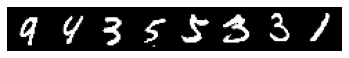

[9 4 3 5 5 3 3 1]


In [ ]:
import matplotlib.pyplot as plt
from torch.utils.data import  DataLoader

# Helper method
def show(grid):
  plt.axis("off")
  plt.imshow(grid.permute(1,2,0).numpy())
  plt.show()    

vis_dataloader = DataLoader(test_dataset, batch_size = 8, shuffle=True)
dataiter = iter(vis_dataloader)
example_batch = next(dataiter) # img1,  label

# display the data
grid = torchvision.utils.make_grid(example_batch[0])
show(grid)
print(example_batch[1].numpy())

# Model

Implement vanilla autoencoder model.

In [ ]:
import torch.nn as nn

class Encoder(nn.Module):
    def __init__(self, latent_size):
      super().__init__()
      self.latent_size = latent_size

      self.encoder = nn.Sequential(
            nn.Conv2d(in_channels = 1, out_channels = 32, kernel_size = 2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 2, stride = 2),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(in_features = 2304, out_features = latent_size)
        )

    def forward(self,x):
      embedding = self.encoder(x)
      return  embedding  

class Decoder(nn.Module):
    def __init__(self, latent_size):
      super().__init__()
      self.latent_size = latent_size

      self.decoder = nn.Sequential(
          nn.Linear(in_features = latent_size, out_features = 2304),
          nn.Unflatten(1, (256, 3, 3)),
          nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size = 3, stride = 2, padding = 1),
          nn.BatchNorm2d(128),
          nn.ReLU(),
          nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size = 2, stride = 2, padding = 1),
          nn.BatchNorm2d(64),
          nn.ReLU(),
          nn.ConvTranspose2d(in_channels = 64, out_channels = 32, kernel_size = 2, stride = 2, padding = 1, output_padding = 1),
          nn.BatchNorm2d(32),
          nn.ReLU(),
          nn.ConvTranspose2d(in_channels = 32, out_channels = 1, kernel_size = 2, stride = 2, padding = 1),
          nn.BatchNorm2d(1)
        )
        
    def forward(self,x):
      recovered = self.decoder(x)  
      return recovered

##Smoke test 

In [ ]:
encoder = Encoder(2)
dummy = torch.randn((1,1,28,28))
print("Encoder In",dummy.shape)
embedding = encoder(dummy)
print("encoder Out",embedding.shape)


decoder = Decoder(2)
recovered = decoder(embedding)
print("Decoder out",recovered.shape)

assert( dummy.shape == recovered.shape) ,"Decoder out shape must be equal to input shape"

Encoder In torch.Size([1, 1, 28, 28])
encoder Out torch.Size([1, 2])
Decoder out torch.Size([1, 1, 28, 28])


###AE

Implement AutoEncoder class. 
Use Decoder and Encoder classes implemented early.

In [ ]:
class AutoEncoder(nn.Module):
  def __init__(self, latent_size):
    super().__init__()
    self.encoder = Encoder(latent_size)
    self.decoder = Decoder(latent_size)

  def forward(self,x):
    embedding = self.encoder(x)
    recovered_x = self.decoder(embedding)
    return recovered_x, embedding

# Train

Define dataloaders

In [ ]:
train_dataloader = DataLoader(train_dataset,shuffle=True,batch_size=128)
test_dataloader = DataLoader(test_dataset,shuffle=False,batch_size=256)

Define main training routine and train your model

In [ ]:
from torch import optim
from torch.utils.tensorboard import SummaryWriter
import numpy as np


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def train(model, epochs, model_name):
  writer = SummaryWriter(log_dir=f"runs/{model_name}")
  criterion = nn.MSELoss()
  optimizer = torch.optim.Adam(model.parameters(), lr = 1e-01)

  for epoch in range(epochs):
    train_losses  = []
    test_losses = []
    model.train()

    for img_batch, labels_batch in train_dataloader:
      img_batch = img_batch.to(device)
      optimizer.zero_grad()
      predictions, embedding = model(img_batch)
      loss = criterion(predictions, img_batch)
      loss.backward()
      optimizer.step()
      train_losses.append(loss.item())

    model.eval()
    for img_batch, labels_batch in train_dataloader:
      img_batch = img_batch.to(device)
      optimizer.zero_grad()
      predictions, embedding = model(img_batch)
      loss = criterion(predictions, img_batch)
      test_losses.append(loss.item())

    writer.add_scalar(f"Loss/train", np.mean(train_losses).item(), epoch)
    writer.add_scalar(f"Loss/test", np.mean(test_losses).item(), epoch)
    writer.flush()
    print(f"Epoch {epoch + 1} Train Loss {np.mean(train_losses).item()} Test Loss {np.mean(test_losses).item()}" )

Для определения лучшего размера латентного пространства сделаем несколько моделей.

In [ ]:
  model1 = AutoEncoder(latent_size = 2)
  model2 = AutoEncoder(latent_size = 10)
  model3 = AutoEncoder(latent_size = 32)
  model4 = AutoEncoder(latent_size = 64)
  model5 = AutoEncoder(latent_size = 128)

In [ ]:
  model1.to(device)
  train(model1, 5, "size 2")

Epoch 1 Train Loss 0.5803849541429263 Test Loss 0.523638191444279
Epoch 2 Train Loss 0.5025778747697883 Test Loss 0.48975384305280917
Epoch 3 Train Loss 0.4837079069761833 Test Loss 0.47330265398472865
Epoch 4 Train Loss 0.4726266761832654 Test Loss 0.4640172772697294
Epoch 5 Train Loss 0.46634162095055653 Test Loss 0.48386225383927317


In [ ]:
  model2.to(device)
  train(model2, 5, "size 10")

Epoch 1 Train Loss 0.434238778947513 Test Loss 0.24912526415609348
Epoch 2 Train Loss 0.21801135944786357 Test Loss 0.19874418944692307
Epoch 3 Train Loss 0.19492009167732205 Test Loss 0.18605257917060528
Epoch 4 Train Loss 0.18286554826729334 Test Loss 0.17667768466701386
Epoch 5 Train Loss 0.17571695749439412 Test Loss 0.16997072319867515


In [ ]:
  model3.to(device)
  train(model3, 5, "size 32")

Epoch 1 Train Loss 0.43939432606641166 Test Loss 0.18563584208107198
Epoch 2 Train Loss 0.12584224278166858 Test Loss 0.10258321120921991
Epoch 3 Train Loss 0.0886522416811762 Test Loss 0.07731131256135033
Epoch 4 Train Loss 0.07545494775115046 Test Loss 0.07013071654066602
Epoch 5 Train Loss 0.06788759927219673 Test Loss 0.06295966515853715


In [ ]:
  model4.to(device)
  train(model4, 5, "size 64")

Epoch 1 Train Loss 0.4423950026030225 Test Loss 0.14743536656726397
Epoch 2 Train Loss 0.10476359775833992 Test Loss 0.0793077883276858
Epoch 3 Train Loss 0.06884556475764653 Test Loss 0.06253836514440173
Epoch 4 Train Loss 0.05655218613967458 Test Loss 0.04935023820063453
Epoch 5 Train Loss 0.0483182104411664 Test Loss 0.04636358940747501


In [ ]:
  model5.to(device)
  train(model5, 5, "size 128")

Epoch 1 Train Loss 0.4964395003405207 Test Loss 0.1792673713235713
Epoch 2 Train Loss 0.11085582364088437 Test Loss 0.08656912826017531
Epoch 3 Train Loss 0.06739526487457981 Test Loss 0.06249951862736043
Epoch 4 Train Loss 0.05187490150364223 Test Loss 0.04383267920567537
Epoch 5 Train Loss 0.043060640790569246 Test Loss 0.03936279231487815


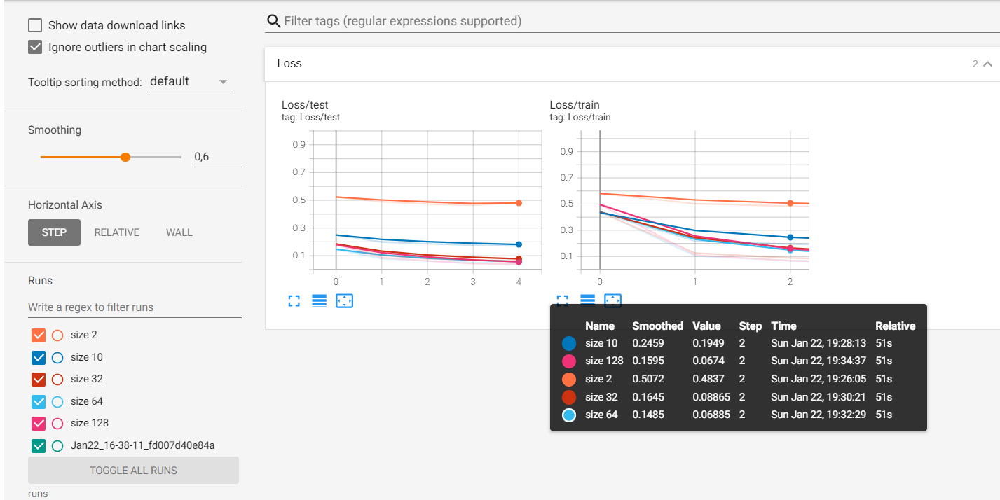

Tensorboard launching code



In [ ]:
import os
import shutil
import tensorflow as tf
import tensorboard as tb

#https://stackoverflow.com/questions/60730544/tensorboard-colab-tensorflow-api-v1-io-gfile-has-no-attribute-get-filesystem
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

# Helper method to run Tensorboard in Colab
def reinit_tensorboard(clear_log = True):
  # Directory for log files
  logs_base_dir = "runs"
  if clear_log:
    # Clear logs
    shutil.rmtree(logs_base_dir, ignore_errors = True)
    os.makedirs(logs_base_dir, exist_ok=True)
  # Colab magic
  %load_ext tensorboard
  %tensorboard --logdir {logs_base_dir}

reinit_tensorboard(False)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 9199), started 1:37:11 ago. (Use '!kill 9199' to kill it.)

<IPython.core.display.Javascript object>

## Let's test the model

Compare original and recovered digits.

<ipython-input-16-1a5e0a964485>:6: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  ax[i,1].imshow((model1(torch.Tensor([train_dataset[i][0].numpy()]).to(device))[0]).cpu().detach().numpy().squeeze())


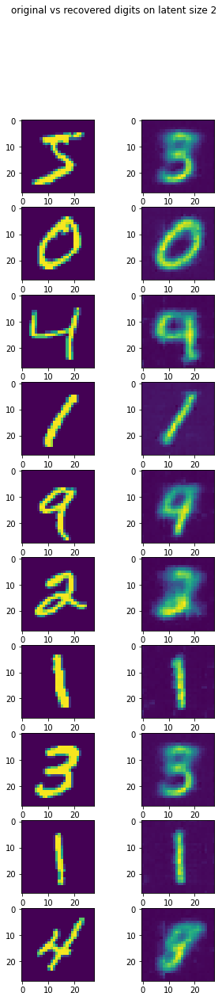

In [ ]:
fig, ax = plt.subplots(10, 2, figsize = (5, 20))
fig.suptitle("original vs recovered digits on latent size 2")

for i in range(10):
  ax[i,0].imshow(train_dataset[i][0].squeeze(0).numpy())
  ax[i,1].imshow((model1(torch.Tensor([train_dataset[i][0].numpy()]).to(device))[0]).cpu().detach().numpy().squeeze())

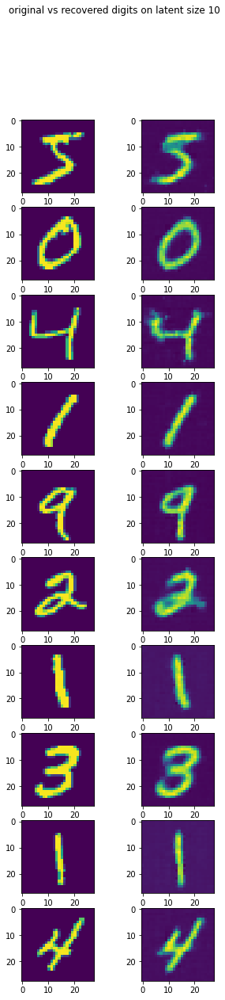

In [ ]:
fig, ax = plt.subplots(10, 2, figsize = (5, 20))
fig.suptitle("original vs recovered digits on latent size 10")

for i in range(10):
  ax[i,0].imshow(train_dataset[i][0].squeeze(0).numpy())
  ax[i,1].imshow((model2(torch.Tensor([train_dataset[i][0].numpy()]).to(device))[0]).cpu().detach().numpy().squeeze())

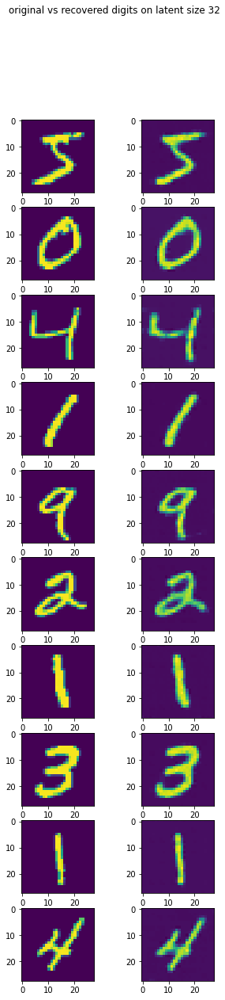

In [ ]:
fig, ax = plt.subplots(10, 2, figsize = (5, 20))
fig.suptitle("original vs recovered digits on latent size 32")

for i in range(10):
  ax[i,0].imshow(train_dataset[i][0].squeeze(0).numpy())
  ax[i,1].imshow((model3(torch.Tensor([train_dataset[i][0].numpy()]).to(device))[0]).cpu().detach().numpy().squeeze())

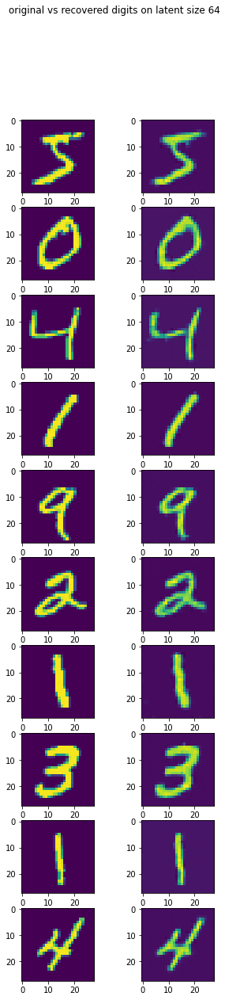

In [ ]:
fig, ax = plt.subplots(10, 2, figsize = (5, 20))
fig.suptitle("original vs recovered digits on latent size 64")

for i in range(10):
  ax[i,0].imshow(train_dataset[i][0].squeeze(0).numpy())
  ax[i,1].imshow((model4(torch.Tensor([train_dataset[i][0].numpy()]).to(device))[0]).cpu().detach().numpy().squeeze())

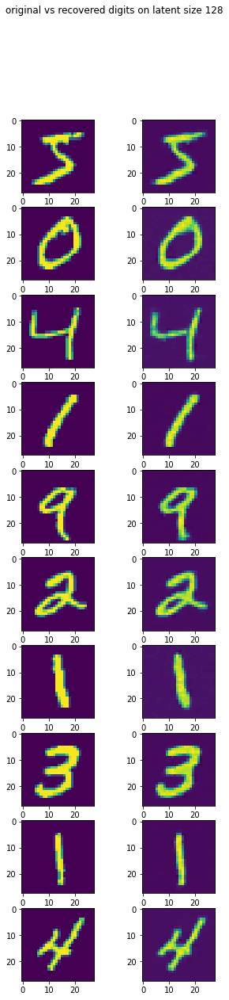

In [ ]:
fig, ax = plt.subplots(10, 2, figsize = (5, 20))
fig.suptitle("original vs recovered digits on latent size 128")

for i in range(10):
  ax[i,0].imshow(train_dataset[i][0].squeeze(0).numpy())
  ax[i,1].imshow((model5(torch.Tensor([train_dataset[i][0].numpy()]).to(device))[0]).cpu().detach().numpy().squeeze())

Show embeddings positions in latent space

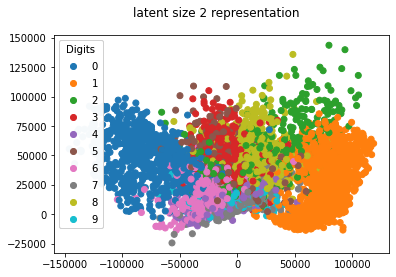

In [ ]:
imgs = torch.reshape(test_dataset.data, (-1,1,28,28)).float()
labels = test_dataset.targets
pred, embeddings = model1(imgs.to(device))
embeddings = embeddings.detach().cpu()

fig, ax = plt.subplots()
fig.suptitle("latent size 2 representation")
scatter = ax.scatter(x = embeddings[:,0], y = embeddings[:,1], c = labels, cmap = 'tab10')

ax.add_artist(ax.legend(*scatter.legend_elements(), title="Digits"))
plt.rcParams["figure.figsize"] = (15,15)
plt.show()

In [ ]:
writer = SummaryWriter()
batch = next(iter(test_dataloader))

_, embedding = model2(batch[0].to(device))
writer.add_embedding(embedding, batch[1].tolist(), batch[0])
writer.flush()
writer.close()

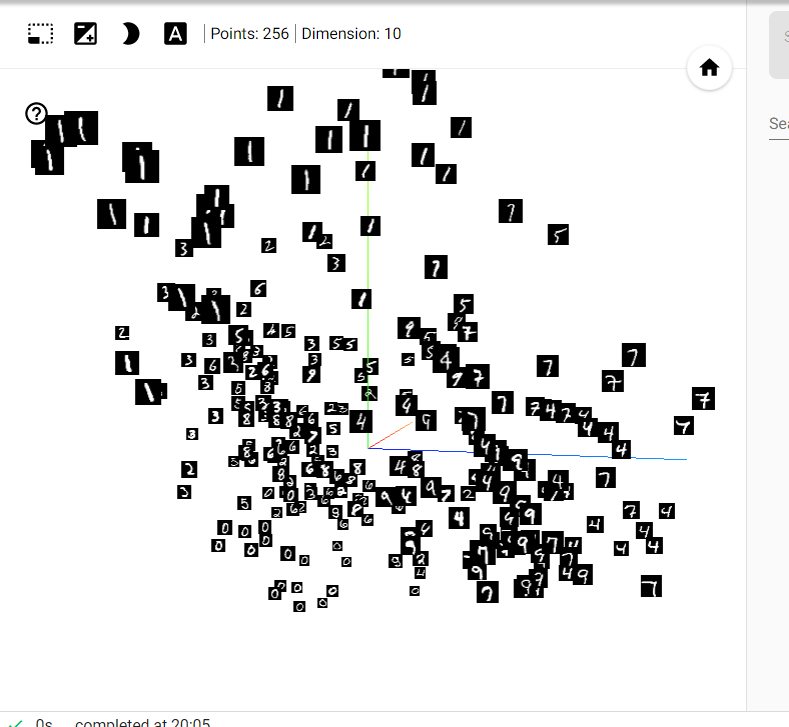

In [ ]:
writer = SummaryWriter()
_, embedding = model3(batch[0].to(device))
writer.add_embedding(embedding, batch[1].tolist(), batch[0], tag = "size 32")
writer.flush()
writer.close()

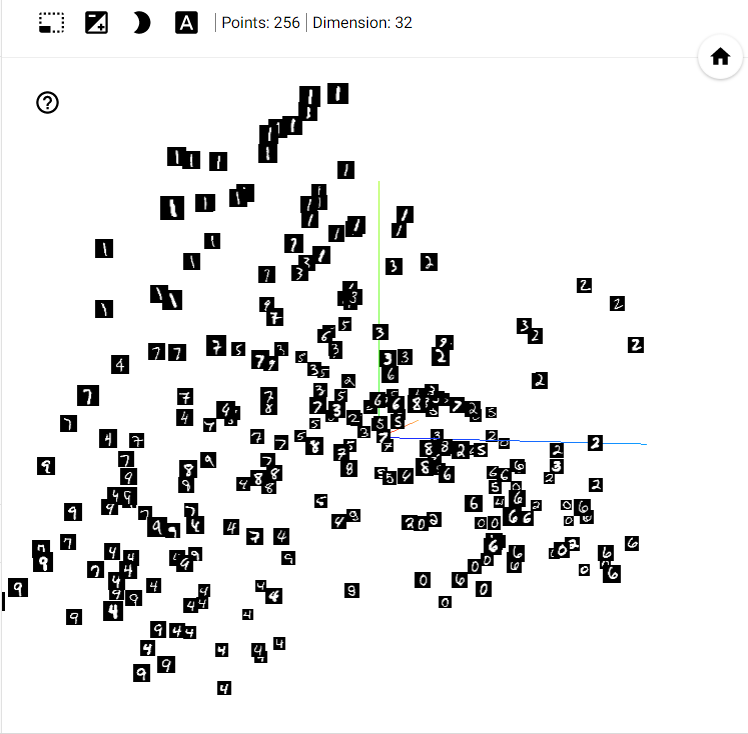

In [ ]:
writer = SummaryWriter()
_, embedding = model4(batch[0].to(device))
writer.add_embedding(embedding, batch[1].tolist(), batch[0], tag = "size 64")
writer.flush()
writer.close()

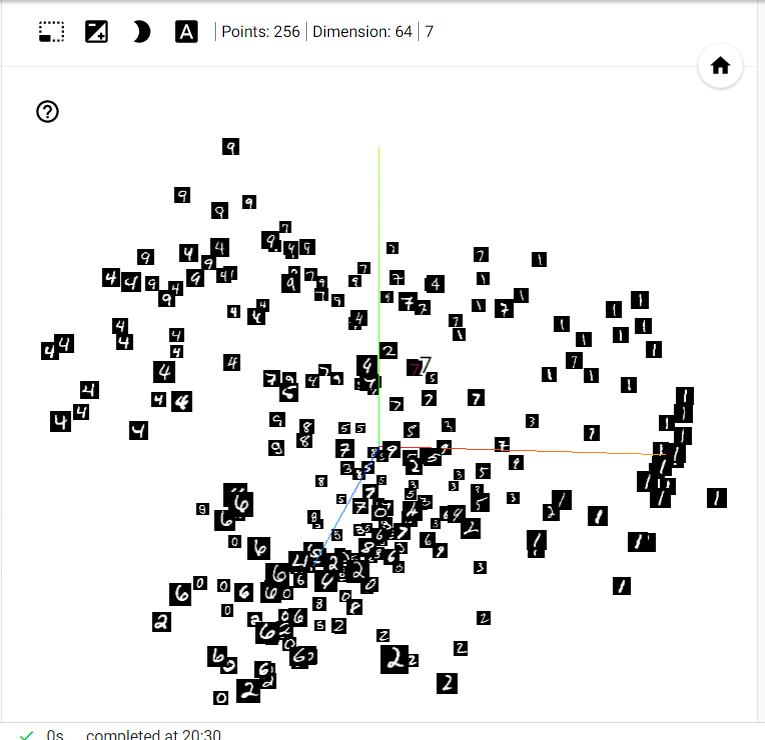

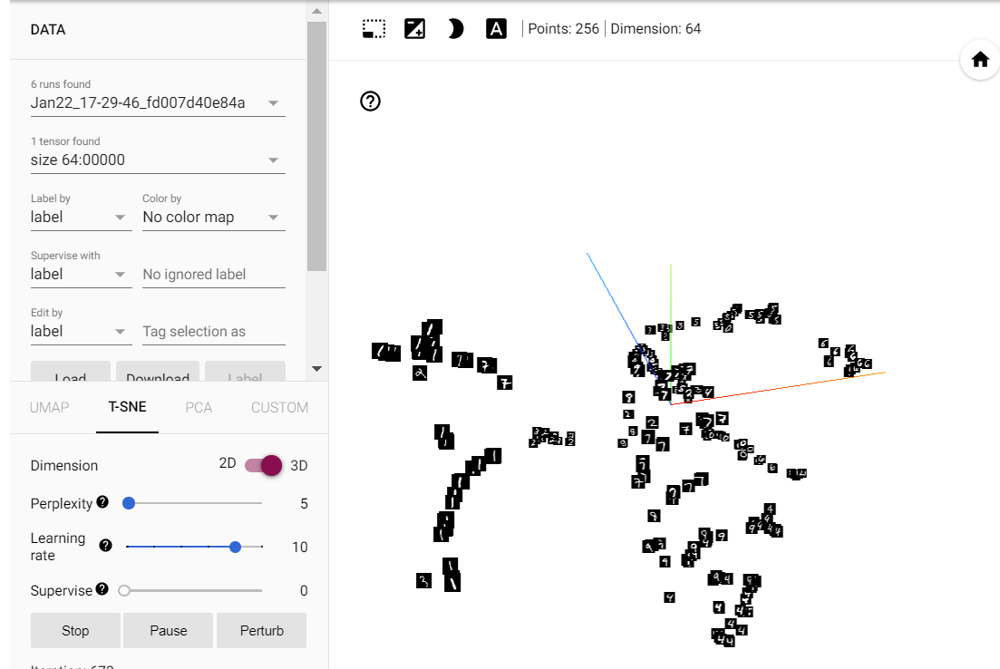

In [ ]:
writer = SummaryWriter()
_, embedding = model5(batch[0].to(device))
writer.add_embedding(embedding, batch[1].tolist(), batch[0], tag = "size 128")
writer.flush()
writer.close()

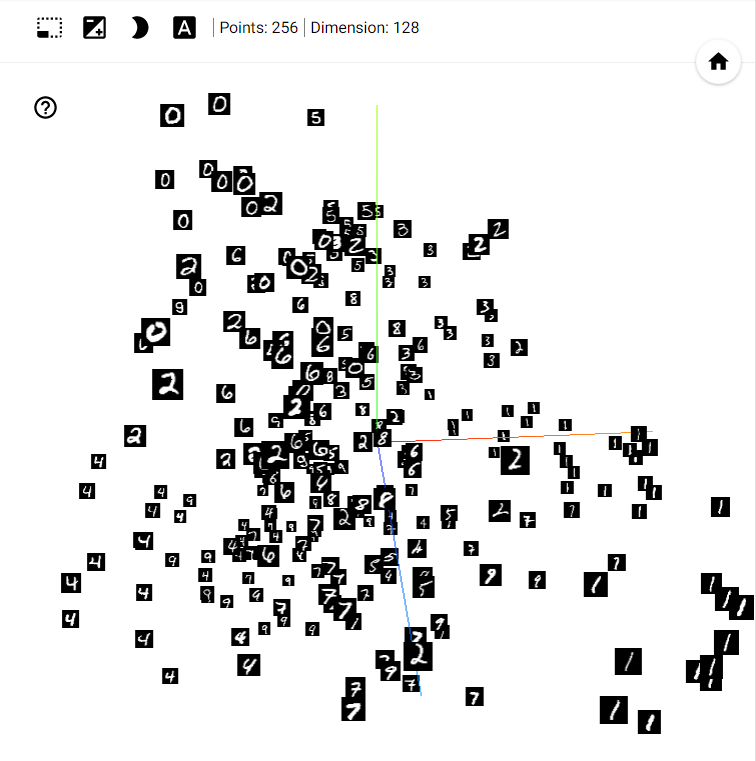

По предварительному трейну лучшая модель - с размером латентного пространства 64. Она не переобучается, но и лосс показывает довольно маленький. Посмотрим как она себя будет вести после обучения, например, на 15 эпохах

In [ ]:
model_final = AutoEncoder(latent_size = 64)
model_final.to(device)
train(model_final, 15, "best model")

Epoch 1 Train Loss 0.4309582713125611 Test Loss 0.15341285528785892
Epoch 2 Train Loss 0.10796746065113336 Test Loss 0.08000691347856766
Epoch 3 Train Loss 0.07049293636576708 Test Loss 0.06113217468423122
Epoch 4 Train Loss 0.05593273915779362 Test Loss 0.053989092726061845
Epoch 5 Train Loss 0.04806421307930306 Test Loss 0.043396859614452575
Epoch 6 Train Loss 0.04312649451053219 Test Loss 0.03943869319043434
Epoch 7 Train Loss 0.0397632107504014 Test Loss 0.035940280450241904
Epoch 8 Train Loss 0.03696108533184666 Test Loss 0.034559637578184414
Epoch 9 Train Loss 0.03494756908289024 Test Loss 0.03254523319301448
Epoch 10 Train Loss 0.03393761858121672 Test Loss 0.03521602231063949
Epoch 11 Train Loss 0.03298611770163594 Test Loss 0.031160416566073768
Epoch 12 Train Loss 0.03230845103703582 Test Loss 0.03701133809205311
Epoch 13 Train Loss 0.03075642871068739 Test Loss 0.028373098604555832
Epoch 14 Train Loss 0.03021489153268622 Test Loss 0.027578243957971458
Epoch 15 Train Loss 0.02

In [ ]:
writer = SummaryWriter()
_, embedding = model_final(batch[0].to(device))
writer.add_embedding(embedding, batch[1].tolist(), batch[0], tag = "size 64 15 epochs")
writer.flush()
writer.close()

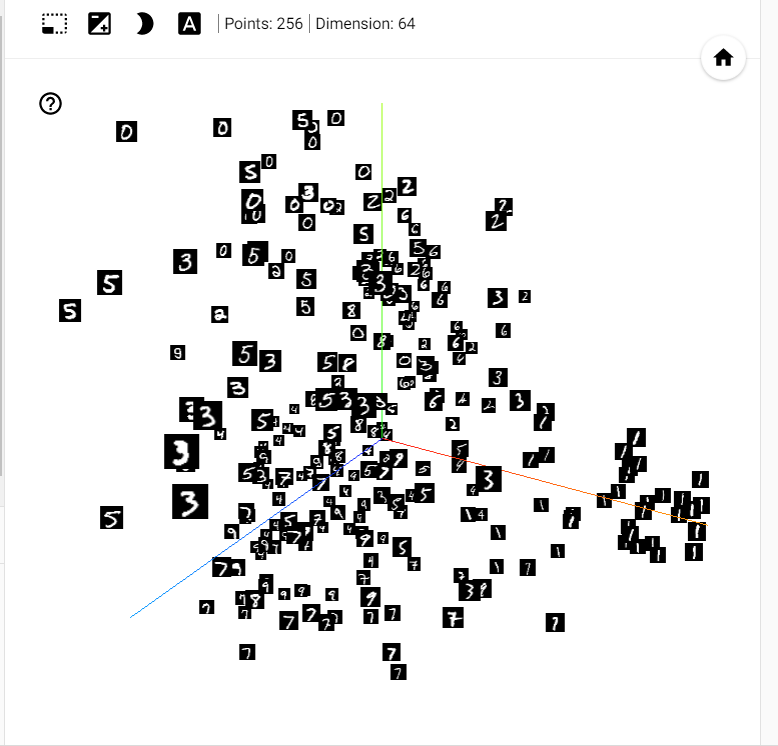

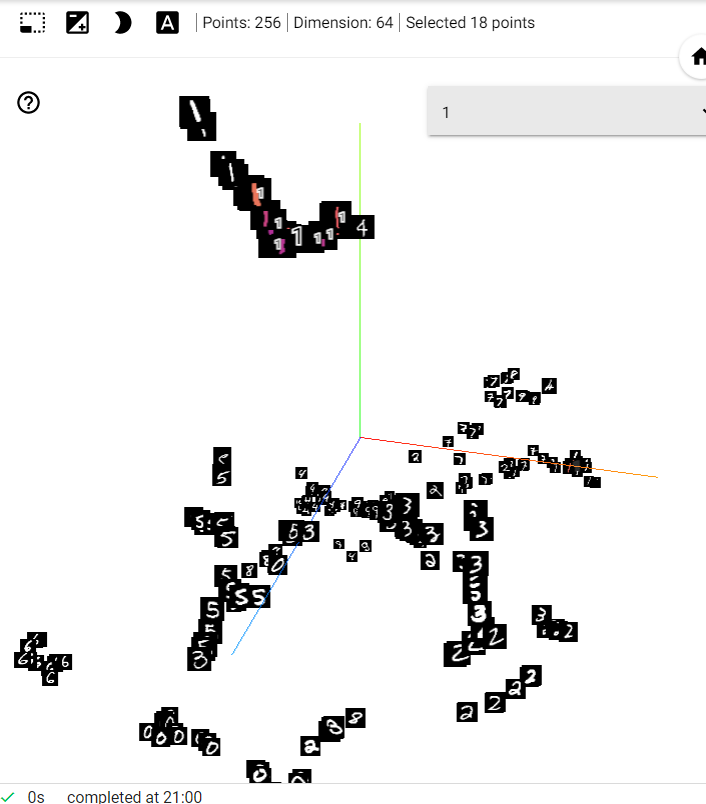

Модель с размерностью 64 показывает довольно хороший результат на 15 эпохах. Также по отображению эмбеддинга (особенно t-sne можно сделать вывод что группы цифр действительно разделяются в пространстве).

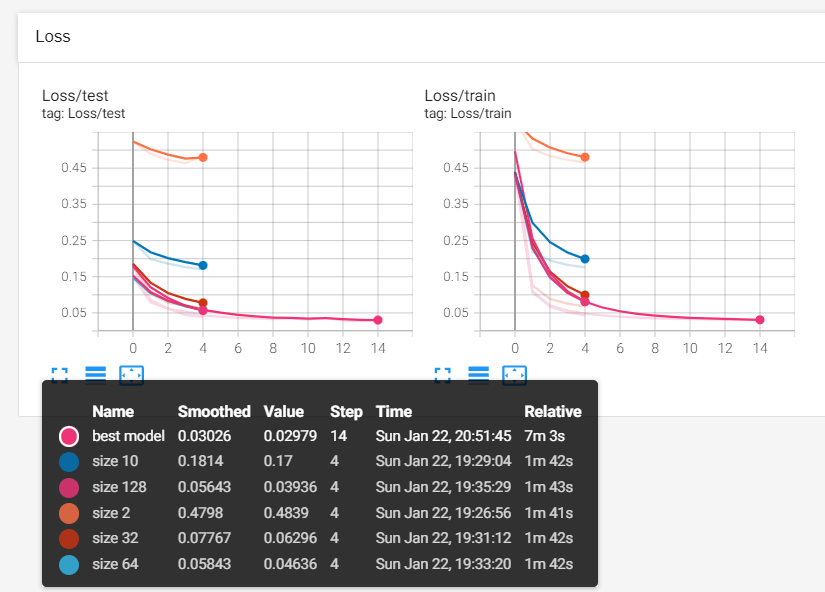

Можно попробовать сделать замену MSE loss на BCE loss. Для этого сделаем другую функцию трейна и прогоним предыдущую модель с этой функцией.

In [ ]:
from torch import optim
from torch.utils.tensorboard import SummaryWriter
import numpy as np


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_final_bce = AutoEncoder(latent_size = 64)
model_final_bce.to(device)

writer = SummaryWriter(log_dir=f"runs/bce")
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model_final_bce.parameters(), lr = 1e-01)

for epoch in range(15):
  train_losses  = []
  test_losses = []
  model_final_bce.train()

  for img_batch, labels_batch in train_dataloader:
    img_batch = img_batch.to(device)
    optimizer.zero_grad()
    predictions, embedding = model_final_bce(img_batch)
    loss = criterion(predictions, img_batch)
    loss.backward()
    optimizer.step()
    train_losses.append(loss.item())

  model_final_bce.eval()
  for img_batch, labels_batch in train_dataloader:
    img_batch = img_batch.to(device)
    optimizer.zero_grad()
    predictions, embedding = model_final_bce(img_batch)
    loss = criterion(predictions, img_batch)
    test_losses.append(loss.item())

  writer.add_scalar(f"Loss/train", np.mean(train_losses).item(), epoch)
  writer.add_scalar(f"Loss/test", np.mean(test_losses).item(), epoch)
  writer.flush()
  print(f"Epoch {epoch + 1} Train Loss {np.mean(train_losses).item()} Test Loss {np.mean(test_losses).item()}" )

Epoch 1 Train Loss 0.41246851244524346 Test Loss 0.13547979058550874
Epoch 2 Train Loss 0.09522016921531418 Test Loss 0.07349442690610886
Epoch 3 Train Loss 0.06311609460982179 Test Loss 0.05889123039586203
Epoch 4 Train Loss 0.0503372393294311 Test Loss 0.047467639689633585
Epoch 5 Train Loss 0.04426139742453723 Test Loss 0.0426254753174304
Epoch 6 Train Loss 0.0410210616441805 Test Loss 0.03768427686682388
Epoch 7 Train Loss 0.037711953502029244 Test Loss 0.04162399073653638
Epoch 8 Train Loss 0.035929793952656455 Test Loss 0.033652697382038084
Epoch 9 Train Loss 0.03408104948985424 Test Loss 0.03705877223725258
Epoch 10 Train Loss 0.03270705999024133 Test Loss 0.029542990326722546
Epoch 11 Train Loss 0.03213163367959101 Test Loss 0.03563527002740008
Epoch 12 Train Loss 0.031042394182607055 Test Loss 0.028890656593289456
Epoch 13 Train Loss 0.030641980187248574 Test Loss 0.028712934784607083
Epoch 14 Train Loss 0.02967937781151805 Test Loss 0.02680697669384322
Epoch 15 Train Loss 0.0

In [ ]:
import os
import shutil
import tensorflow as tf
import tensorboard as tb

In [ ]:
batch = next(iter(test_dataloader))
writer = SummaryWriter()
_, embedding = model_final_bce(batch[0].to(device))
writer.add_embedding(embedding, batch[1].tolist(), batch[0], tag = "bce")
writer.flush()
writer.close()

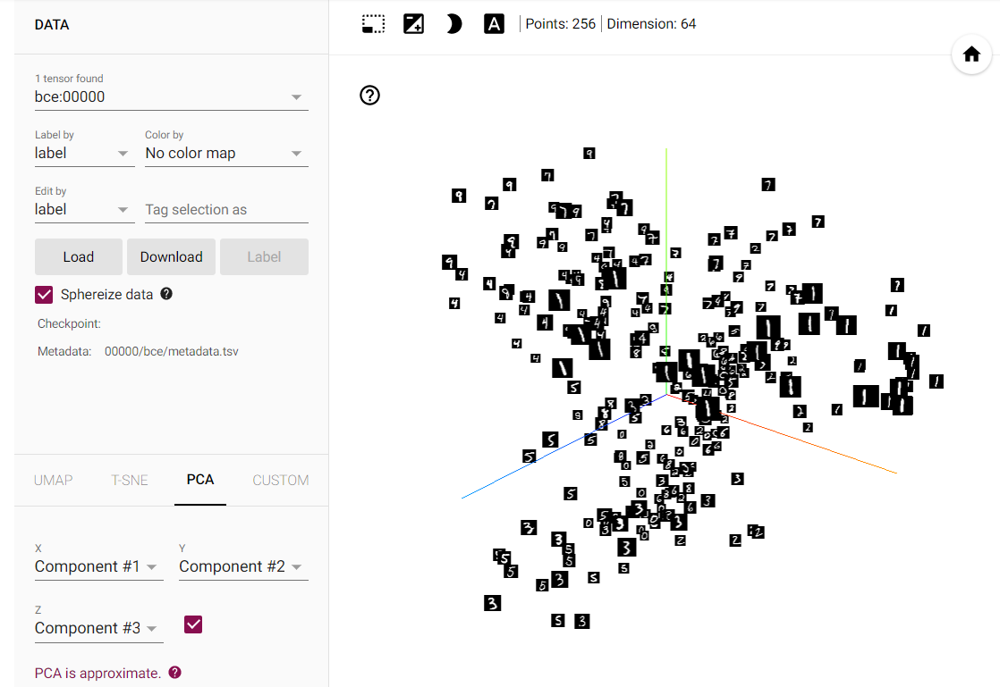

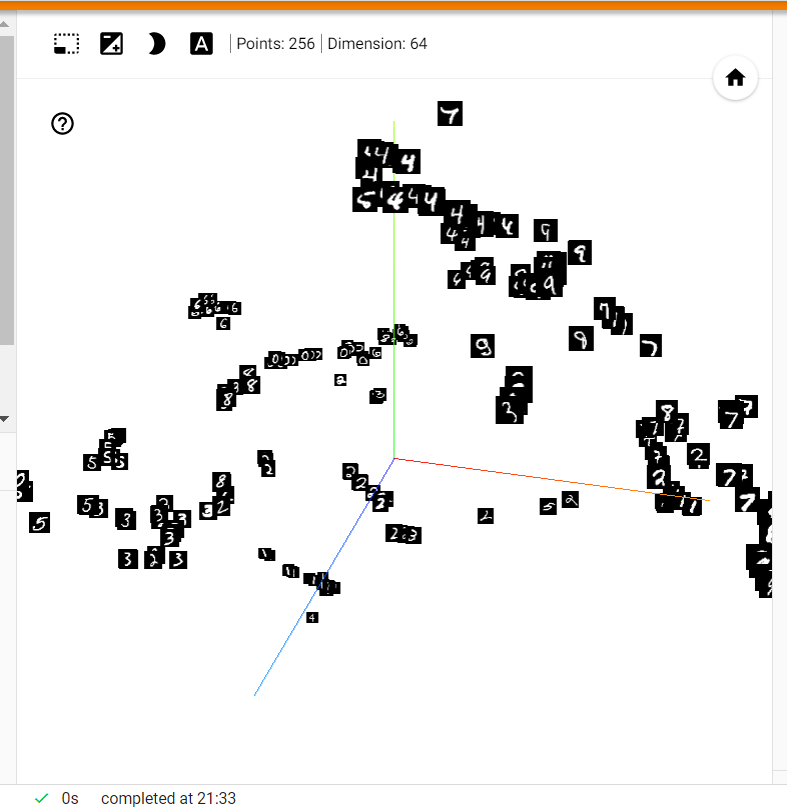

мне не удалось найти каких-то особых отличий при использовании BCE

# Conclusion
В целом автоэнкодеры работают очень достойно, если брать векторное пространство достаточного размера - достаточное при этом примерно значит больше двух (можно предположить, что число классов - это какое-то примерное значение, около которого имеет смысл искать, но это неточно - можно придумать такие классы, которые будут различаться меньшим существенным количеством вещей, или существенно большим). Во всяком случае, модели с размером начиная от 10 работают неплохо - они показывают довольно маленький лосс, причем не переобучаются благодаря настройкам трейна. 

По отображению эмбеддингов из тензорборда можно понять, что цифры действительно распределяются в пространстве в соответствии с визуальной похожестью, и их разделение довольно четкое, что говорит о том что модели действительно неплохо их разделяют.

Попытка найти лучшую размерность латентного пространства была не очень плодотворной. Мне кажется, 64 - хорошее значение, но кажется все больше 2 - примерно одинаково хороши.

Изображения оригинальных и восстановленных цифр также показывает, что все размерности начиная с 10 в целом позволяют корректно различать цифры и отличаются только четкостью

# Ideas for extra work

* Find the best latent space size - сделано
* Implement noise filtration with AE
* Test vector arithmetic in laent space
* Implemet VAE 
** Use Autoencoder class as base class
** Implement VAE Loss class
** Plot embeddings manifold in VAE latent space
** Compare decoding results VAE latent space with vanilla Autoencoder results
* Replace reconstruction loss from MSE to BCE - сделано 
* Implement Conditional Autoencoder or CVAE